In [1]:
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
import shap
import pandas as pd
from sklearn.datasets import load_boston
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score

shap.initjs()

In [2]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [3]:
##TODO

csv_file = '/Users/swcam/Documents/GitHub/Sarcasm/Final_data/liwc_response_train.csv'

Train_df = pd.read_csv(csv_file,index_col=False)

# print out the first few rows of data info
Train_df.head(5)




,Unnamed: 0,verb,funct,auxverb,present,pronoun,ipron,cogmech,certain,ppron,you,social,affect,posemo,conj,tentat,excl,future,discrep,past,motion,relativ,space,preps,incl,adverb,insight,shehe,achieve,negemo,anger,they,cause,article,money,work,percept,hear,swear,time,negate,leisure,death,number,see,sad,quant,anx,assent,bio,health,filler,body,friend,sexual,we,home,feel,inhib,humans,i,family,relig,nonfl,ingest,label,noun_count_percent,adj_count_percent,adv_count_percent,pro_count_percent,char_count,word_density,punctuation_count,upper_case_word_count,vader_pos,vader_neg,vader_neu,vader_compound,response,Response_emotion,valence_response,arousal_response,dominance_response,tokenized_text
0,0,7,13,3,5,5,1,6,1,4,3,4,2,2,2,1,1,1,1,1,1,2,1,2,2,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.310345,0.034483,0.172414,0.172414,4.862069,0.167658,0.379310,0.137931,0.204,0.000,0.796,0.87530,I don't get this .. obviously you do car...,sadness,6.222500,3.695000,5.965000,"['I', 'do', ""n't"", 'get', 'this', '..', 'obvio..."
1,1,2,11,1,2,5,1,3,0,4,0,4,1,0,2,0,0,0,0,0,0,0,0,3,2,2,0,2,1,1,1,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.250000,0.000000,0.000000,0.166667,5.000000,0.208333,0.166667,0.125000,0.000,0.256,0.744,0.11985,trying to protest about . Talking about hi...,anger,5.190000,3.713333,5.733333,"['trying', 'to', 'protest', 'about', '.', 'Tal..."
2,2,1,5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,1,0,0,0,0,0,0,1,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.055556,0.000000,0.000000,0.055556,5.777778,0.320988,0.333333,0.222222,0.000,0.176,0.824,0.27130,He makes an insane about of money from t...,anger,5.246667,5.223333,5.426667,"['He', 'makes', 'an', 'insane', 'about', 'of',..."
3,3,3,9,1,0,4,0,2,1,4,0,5,1,0,1,0,0,0,0,3,0,1,0,0,1,2,0,3,0,1,1,1,0,1,0,3,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.208333,0.041667,0.166667,0.166667,5.833333,0.243056,0.166667,0.125000,0.000,0.130,0.870,0.24470,Meanwhile Trump won't even release his SAT...,anger,5.661111,4.428889,5.907778,"['Meanwhile', 'Trump', 'wo', ""n't"", 'even', 'r..."
4,4,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.060606,0.030303,0.030303,0.030303,5.575758,0.168962,0.393939,0.090909,0.193,0.000,0.807,0.83525,Pretty Sure the Anti-Lincoln Crowd Claimed...,joy,5.000000,5.000000,5.000000,"['Pretty', 'Sure', 'the', 'Anti-Lincoln', 'Cro..."


In [4]:
Train_df = Train_df.loc[:, ~Train_df.columns.str.contains('^Unnamed')]

In [5]:
Train_df.head()

,verb,funct,auxverb,present,pronoun,ipron,cogmech,certain,ppron,you,social,affect,posemo,conj,tentat,excl,future,discrep,past,motion,relativ,space,preps,incl,adverb,insight,shehe,achieve,negemo,anger,they,cause,article,money,work,percept,hear,swear,time,negate,leisure,death,number,see,sad,quant,anx,assent,bio,health,filler,body,friend,sexual,we,home,feel,inhib,humans,i,family,relig,nonfl,ingest,label,noun_count_percent,adj_count_percent,adv_count_percent,pro_count_percent,char_count,word_density,punctuation_count,upper_case_word_count,vader_pos,vader_neg,vader_neu,vader_compound,response,Response_emotion,valence_response,arousal_response,dominance_response,tokenized_text
0,7,13,3,5,5,1,6,1,4,3,4,2,2,2,1,1,1,1,1,1,2,1,2,2,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.310345,0.034483,0.172414,0.172414,4.862069,0.167658,0.379310,0.137931,0.204,0.000,0.796,0.87530,I don't get this .. obviously you do car...,sadness,6.222500,3.695000,5.965000,"['I', 'do', ""n't"", 'get', 'this', '..', 'obvio..."
1,2,11,1,2,5,1,3,0,4,0,4,1,0,2,0,0,0,0,0,0,0,0,3,2,2,0,2,1,1,1,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.250000,0.000000,0.000000,0.166667,5.000000,0.208333,0.166667,0.125000,0.000,0.256,0.744,0.11985,trying to protest about . Talking about hi...,anger,5.190000,3.713333,5.733333,"['trying', 'to', 'protest', 'about', '.', 'Tal..."
2,1,5,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,1,0,0,0,0,0,0,1,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.055556,0.000000,0.000000,0.055556,5.777778,0.320988,0.333333,0.222222,0.000,0.176,0.824,0.27130,He makes an insane about of money from t...,anger,5.246667,5.223333,5.426667,"['He', 'makes', 'an', 'insane', 'about', 'of',..."
3,3,9,1,0,4,0,2,1,4,0,5,1,0,1,0,0,0,0,3,0,1,0,0,1,2,0,3,0,1,1,1,0,1,0,3,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.208333,0.041667,0.166667,0.166667,5.833333,0.243056,0.166667,0.125000,0.000,0.130,0.870,0.24470,Meanwhile Trump won't even release his SAT...,anger,5.661111,4.428889,5.907778,"['Meanwhile', 'Trump', 'wo', ""n't"", 'even', 'r..."
4,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,SARCASM,0.060606,0.030303,0.030303,0.030303,5.575758,0.168962,0.393939,0.090909,0.193,0.000,0.807,0.83525,Pretty Sure the Anti-Lincoln Crowd Claimed...,joy,5.000000,5.000000,5.000000,"['Pretty', 'Sure', 'the', 'Anti-Lincoln', 'Cro..."


In [6]:
##TODO



csv_file = '/Users/swcam/Documents/GitHub/Sarcasm/Final_data/liwc_response_test.csv'

Test_df = pd.read_csv(csv_file)

# print out the first few rows of data info
Test_df.head(5)



,Unnamed: 0,time,relativ,funct,pronoun,ipron,adverb,cogmech,excl,leisure,conj,incl,verb,past,social,ppron,i,cause,humans,certain,achieve,preps,tentat,space,affect,filler,posemo,present,they,shehe,negemo,anger,quant,auxverb,article,insight,work,you,motion,discrep,assent,inhib,home,percept,hear,anx,sad,see,money,negate,bio,health,sexual,nonfl,future,swear,ingest,feel,number,body,relig,family,we,death,friend,Unnamed: 0.1,label,noun_count_percent,adj_count_percent,adv_count_percent,pro_count_percent,char_count,word_density,punctuation_count,upper_case_word_count,vader_pos,vader_neg,vader_neu,vader_compound,response,Response_emotion,valence_response,arousal_response,dominance_response,tokenized_text
0,0,6.0,6.0,19.0,9.0,5.0,3.0,9.0,2.0,2.0,5.0,2.0,2.0,1.0,7.0,4.0,1.0,3.0,1.0,1.0,4.0,3.0,1.0,1.0,4.0,1.0,3.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,NOT_SARCASM,0.134328,0.104478,0.089552,0.074627,4.567164,0.068167,0.283582,0.074627,0.147,0.134,0.719,0.71005,"My 3 year old , that just finished readi...",joy,5.671111,4.181667,5.976667,"['My', '3', 'year', 'old', ',', 'that', 'just'..."
1,1,1.0,1.0,6.0,1.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,2.0,1.0,2.0,1.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,3.0,0.0,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,SARCASM,0.181818,0.136364,0.045455,0.090909,4.818182,0.219008,0.363636,0.090909,0.215,0.131,0.654,0.60115,How many verifiable lies has he told now ?...,joy,5.442857,3.635714,5.554286,"['How', 'many', 'verifiable', 'lies', 'has', '..."
2,2,0.0,0.0,7.0,1.0,1.0,1.0,4.0,1.0,2.0,0.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,SARCASM,0.130435,0.043478,0.043478,0.043478,4.695652,0.204159,0.260870,0.173913,0.000,0.000,1.000,0.50000,Maybe Docs just a scrub of a coach ... I...,anger,5.236250,4.210000,5.270000,"['Maybe', 'Docs', 'just', 'a', 'scrub', 'of', ..."
3,3,0.0,4.0,9.0,0.0,0.0,1.0,3.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,4.0,1.0,0.0,0.0,2.0,0.0,0.0,1.0,1.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,NOT_SARCASM,0.045455,0.090909,0.045455,0.000000,4.272727,0.194215,0.318182,0.181818,0.000,0.200,0.800,0.19430,is just a cover up for the real hate insid...,anger,5.174000,4.290000,5.474000,"['is', 'just', 'a', 'cover', 'up', 'for', 'the..."
4,4,0.0,0.0,6.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,3.0,0.0,2.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,NOT_SARCASM,0.200000,0.000000,0.133333,0.066667,4.200000,0.280000,0.266667,0.200000,0.000,0.091,0.909,0.47420,The irony being that he even has to ask ...,anger,5.795000,3.630000,5.697500,"['The', 'irony', 'being', 'that', 'he', 'even'..."


In [7]:
Test_df = Test_df.loc[:, ~Test_df.columns.str.contains('^Unnamed')]

In [8]:
corpus_train = Train_df

Xtest= Test_df

ytrain= Train_df['label']

ytest = Test_df['label']

In [9]:
X = Xtest.copy()
y = ytest.copy()

In [11]:

X['Response_emotion'] = X['Response_emotion'].astype('category').cat.codes


In [12]:


from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
y = lb.fit_transform(y)

In [13]:
X = X.drop(['tokenized_text','label','response'], axis=1)

In [15]:
# Split the data
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y)

In [26]:
# Initiate and fit a Random Forest Regressor 
rf_reg = RandomForestRegressor(n_estimators=100)
rf_reg.fit(Xtrain, ytrain.ravel())

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [27]:
rf_train = rf_reg.score(Xtrain, ytrain.ravel())
rf_cv = cross_val_score(rf_reg, Xtrain, ytrain.ravel(), cv=5).mean()
rf_test = rf_reg.score(Xtest, ytest.ravel())
print('Evaluation of the Random Forest performance\n')
print(f'Training score: {rf_train.round(4)}')
print(f'Cross validation score: {rf_cv.round(4)}')
print(f'Test score: {rf_test.round(4)}')

Evaluation of the Random Forest performance

Training score: 0.8775
Cross validation score: 0.1009
Test score: 0.139


In [28]:
# Initialize JavaScript visualization - use Jupyter notebook to see the interactive features of the plots
shap.initjs()

In [29]:
# Create a TreeExplainer and extract shap values from it - will be used for plotting later
explainer = shap.TreeExplainer(rf_reg)
shap_values = explainer.shap_values(X)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [30]:
# shap force plot for the first prediction. Here we want to interpret the output value for the 1st observation in our dataframe. 
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [31]:
# SHAP values for all predictions and the direction of their impact
shap.force_plot(explainer.expected_value, shap_values, X)

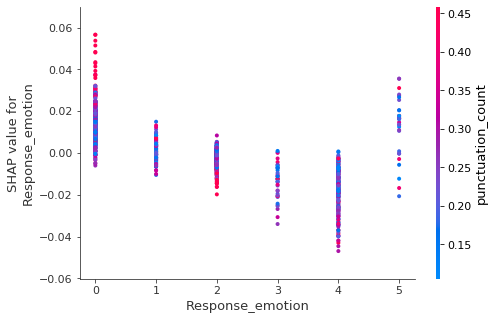

In [32]:
# Effect of a single feature on the shap value,and automatically selected other feature to show dependence 
shap.dependence_plot('Response_emotion', shap_values, X)

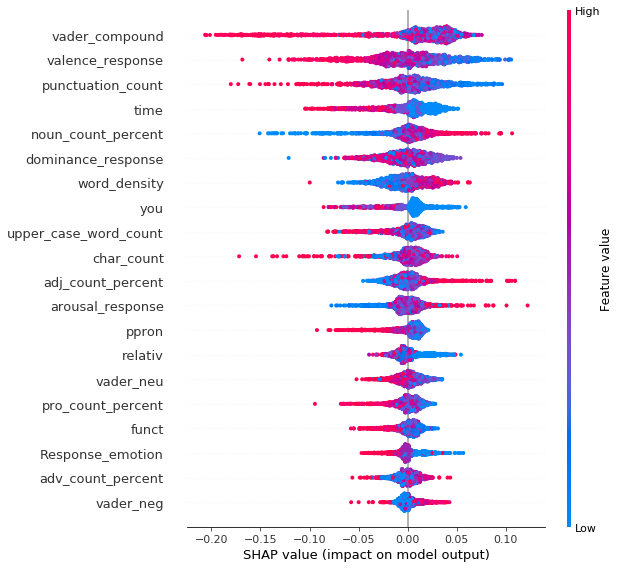

In [33]:
# See the absolute shap value of how each feaure contributes to the model output
shap.summary_plot(shap_values, X)

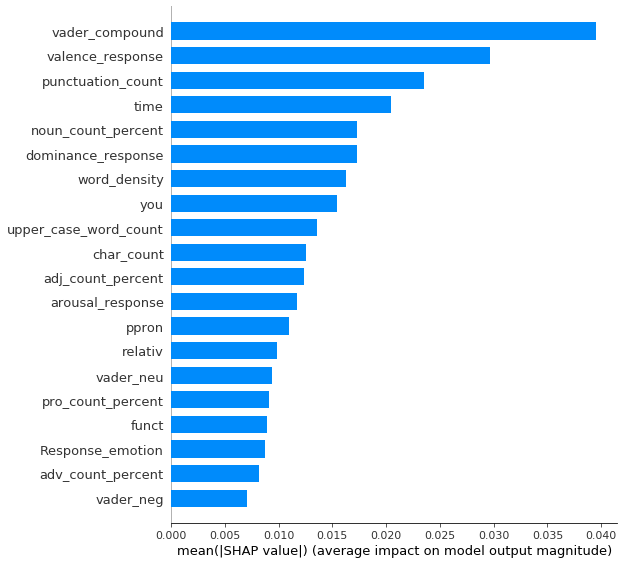

In [34]:
shap.summary_plot(shap_values, X, plot_type="bar")